# How to Train Scaled-YOLOv4 on Custom Objects

Scaled-YOLOv4 uses the same training procedures as YOLOv5.

This tutorial is based on the [YOLOv5 repository](https://github.com/ultralytics/yolov5) by [Ultralytics](https://www.ultralytics.com/). This notebook shows training on **your own custom objects**. Many thanks to Ultralytics for putting this repository together - we hope that in combination with clean data management tools at Roboflow, this technologoy will become easily accessible to any developer wishing to use computer vision in their projects.

### Accompanying Blog Post

A blog on Scaled-YOLOv4 is to come, in the meantime having the blog for [how to train YOLOv5](https://blog.roboflow.ai/how-to-train-yolov5-on-a-custom-dataset/)will be useful.

### Steps Covered in this Tutorial

In this tutorial, we will walk through the steps required to train Scaled-YOLOv4 on your custom objects. We use a [public blood cell detection dataset](https://public.roboflow.ai/object-detection/bccd), which is open source and free to use. You can also use this notebook on your own data.

To train our detector we take the following steps:

* Install Scaled-YOLOv4 dependencies
* Download custom Scaled-YOLOv4 object detection data
* Write our Scaled-YOLOv4 Training configuration
* Run Scaled-YOLOv4 training
* Evaluate Scaled-YOLOv4 performance
* Visualize Scaled-YOLOv4 training data
* Run Scaled-YOLOv4 inference on test images
* Export saved Scaled-YOLOv4 weights for future inference



### **About**

[Roboflow](https://roboflow.com) enables teams to deploy custom computer vision models quickly and accurately. Convert data from to annotation format, assess dataset health, preprocess, augment, and more. It's free for your first 1000 source images.

**Looking for a vision model available via API without hassle? Try Roboflow Train.**

![Roboflow Wordmark](https://i.imgur.com/dcLNMhV.png)



#Install Dependencies

_(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [1]:
# clone Scaled_YOLOv4
!git clone https://github.com/roboflow-ai/ScaledYOLOv4.git  # clone repo
%cd /content/ScaledYOLOv4/
#checkout the yolov4-large branch
!git checkout yolov4-large

Cloning into 'ScaledYOLOv4'...
remote: Enumerating objects: 133, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 133 (delta 0), reused 2 (delta 0), pack-reused 128 (from 1)
Receiving objects: 100% (133/133), 409.42 KiB | 1.31 MiB/s, done.
Resolving deltas: 100% (39/39), done.
/content/ScaledYOLOv4
Branch 'yolov4-large' set up to track remote branch 'yolov4-large' from 'origin'.
Switched to a new branch 'yolov4-large'


In [2]:
import torch
print('Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Using torch 2.6.0+cu124 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15095MB, multi_processor_count=40, uuid=312bad61-12be-5b08-d12a-8cf0dd9b190b, L2_cache_size=4MB)


In [3]:
#install mish activation funciton for cuda
%cd /content/
!git clone https://github.com/JunnYu/mish-cuda
%cd mish-cuda
!python setup.py build install

/content
Cloning into 'mish-cuda'...
remote: Enumerating objects: 195, done.
remote: Counting objects: 100% (26/26), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 195 (delta 20), reused 20 (delta 20), pack-reused 169 (from 1)
Receiving objects: 100% (195/195), 203.57 KiB | 1.03 MiB/s, done.
Resolving deltas: 100% (64/64), done.
/content/mish-cuda
/usr/local/lib/python3.11/dist-packages/setuptools/_distutils/extension.py:139: UserWarning: Unknown Extension options: 'headers'
  warnings.warn(msg)
running build
running build_py
creating build/lib.linux-x86_64-cpython-311/mish_cuda
copying src/mish_cuda/__init__.py -> build/lib.linux-x86_64-cpython-311/mish_cuda
running egg_info
creating src/mish_cuda.egg-info
writing src/mish_cuda.egg-info/PKG-INFO
writing dependency_links to src/mish_cuda.egg-info/dependency_links.txt
writing requirements to src/mish_cuda.egg-info/requires.txt
writing top-level names to src/mish_cuda.egg-info/top_level.txt
writing manifest file 'src/

In [4]:
!pip install -U PyYAML

DEPRECATION: Loading egg at /usr/local/lib/python3.11/dist-packages/nvidia_nvjitlink_cu12-12.4.127-py3.11-linux-x86_64.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
DEPRECATION: Loading egg at /usr/local/lib/python3.11/dist-packages/nvidia_cudnn_cu12-9.1.0.70-py3.11-linux-x86_64.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
DEPRECATION: Loading egg at /usr/local/lib/python3.11/dist-packages/nvidia_cusparse_cu12-12.3.1.170-py3.11-linux-x86_64.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
DEPRECATION: Loading egg at /usr/local/lib/python3.11/dist-pa

In [6]:
%cd /content/ScaledYOLOv4/


/content/ScaledYOLOv4


# Download Correctly Formatted Custom Dataset

We'll download our dataset from Roboflow. Use the "**YOLOv5 PyTorch**" export format. Note that the Ultralytics implementation calls for a YAML file defining where your training and test data is. The Roboflow export also writes this format for us.

To get your data into Roboflow, follow the [Getting Started Guide](https://blog.roboflow.ai/getting-started-with-roboflow/).



![YOLOv5 PyTorch export](https://i.imgur.com/5vr9G2u.png)


In [7]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="MSTLCqMPLGU0ORbaEBPl")
project = rf.workspace("stephen-6z8o2").project("safety-pyazl")
version = project.version(1)
dataset = version.download("yolov4scaled")


DEPRECATION: Loading egg at /usr/local/lib/python3.11/dist-packages/nvidia_nvjitlink_cu12-12.4.127-py3.11-linux-x86_64.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
DEPRECATION: Loading egg at /usr/local/lib/python3.11/dist-packages/nvidia_cudnn_cu12-9.1.0.70-py3.11-linux-x86_64.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
DEPRECATION: Loading egg at /usr/local/lib/python3.11/dist-packages/nvidia_cusparse_cu12-12.3.1.170-py3.11-linux-x86_64.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
DEPRECATION: Loading egg at /usr/local/lib/python3.11/dist-pa


Extracting Dataset Version Zip to safety-1 in yolov4scaled:: 100%|██████████| 2892/2892 [00:00<00:00, 5248.25it/s]


In [8]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat {dataset.location}/data.yaml

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 8
names: ['Boots', 'Ear-protection', 'Glass', 'Glove', 'Helmet', 'Mask', 'Person', 'Vest']

roboflow:
  workspace: stephen-6z8o2
  project: safety-pyazl
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/stephen-6z8o2/safety-pyazl/dataset/1

#Inspect Model Configuration and Architecture

Let's look at the Scaled-YOLOv4 Configuration architecture

In [9]:
%cat /content/ScaledYOLOv4/models/yolov4-csp.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 1.0  # model depth multiple
width_multiple: 1.0  # layer channel multiple

# anchors
anchors:
  - [12,16, 19,36, 40,28]  # P3/8
  - [36,75, 76,55, 72,146]  # P4/16
  - [142,110, 192,243, 459,401]  # P5/32

# yolov4-csp backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [32, 3, 1]],  # 0
   [-1, 1, Conv, [64, 3, 2]],  # 1-P1/2
   [-1, 1, Bottleneck, [64]],
   [-1, 1, Conv, [128, 3, 2]],  # 3-P2/4
   [-1, 2, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 5-P3/8
   [-1, 8, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 7-P4/16
   [-1, 8, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]], # 9-P5/32
   [-1, 4, BottleneckCSP, [1024]],  # 10
  ]

# yolov4-csp head
# na = len(anchors[0])
head:
  [[-1, 1, SPPCSP, [512]], # 11
   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [8, 1, Conv, [256, 1, 1]], # route backbone P4
   [[-1, -2], 1, Concat, [1]],
   [-1, 2, Bott

# Train Custom Scaled-YOLOv4 Detector

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights.
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [10]:
orig_dataset_directory = dataset.location
orig_dataset_directory

'/content/ScaledYOLOv4/safety-1'

In [11]:
%cd {orig_dataset_directory}
%cp -r {orig_dataset_directory} /content/ScaledYOLOv4

/content/ScaledYOLOv4/safety-1
cp: '/content/ScaledYOLOv4/safety-1' and '/content/ScaledYOLOv4/safety-1' are the same file


In [13]:
!pip install ultralytics

DEPRECATION: Loading egg at /usr/local/lib/python3.11/dist-packages/nvidia_nvjitlink_cu12-12.4.127-py3.11-linux-x86_64.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
DEPRECATION: Loading egg at /usr/local/lib/python3.11/dist-packages/nvidia_cudnn_cu12-9.1.0.70-py3.11-linux-x86_64.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
DEPRECATION: Loading egg at /usr/local/lib/python3.11/dist-packages/nvidia_cusparse_cu12-12.3.1.170-py3.11-linux-x86_64.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
DEPRECATION: Loading egg at /usr/local/lib/python3.11/dist-pa

In [20]:
from ultralytics import YOLO
# Load a COCO-pretrained YOLOv3u model
model = YOLO("/content/ScaledYOLOv4/runs/detect/train/weights/last.pt")

# Train the model on the COCO8 example dataset for 100 epochs
results = model.train(data="/content/ScaledYOLOv4/safety-1/data.yaml", epochs=2, imgsz=640)

Ultralytics 8.3.132 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/ScaledYOLOv4/safety-1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=2, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/ScaledYOLOv4/runs/detect/train/weights/last.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patienc

train: Scanning /content/ScaledYOLOv4/safety-1/train/labels.cache... 1260 images, 1 backgrounds, 0 corrupt: 100%|██████████| 1260/1260 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 409.9±81.2 MB/s, size: 52.1 KB)


val: Scanning /content/ScaledYOLOv4/safety-1/valid/labels.cache... 120 images, 0 backgrounds, 0 corrupt: 100%|██████████| 120/120 [00:00<?, ?it/s]


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000833, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train3
Starting training for 2 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/2      11.8G     0.7199     0.5046      1.075        146        640: 100%|██████████| 79/79 [00:46<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.37it/s]

                   all        120        577      0.955      0.918      0.964      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/2      7.08G     0.6923     0.4728      1.052        137        640: 100%|██████████| 79/79 [00:43<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.35it/s]

                   all        120        577      0.941      0.924      0.961      0.769



2 epochs completed in 0.027 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 52.0MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics 8.3.132 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,844,392 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.15it/s]


                   all        120        577      0.941      0.925      0.961      0.769
                 Boots         90        190      0.942      0.895      0.942      0.694
                Helmet         89        115      0.939      0.931      0.947      0.721
                Person         96        109      0.943      0.911      0.976      0.864
                  Vest        111        163       0.94      0.963      0.979      0.796
Speed: 0.2ms preprocess, 10.5ms inference, 0.0ms loss, 4.6ms postprocess per image
Results saved to runs/detect/train3


# Evaluate Custom Scaled-YOLOv4 Detector Performance

Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes.

Note from Glenn: Partially completed `results.txt` files can be plotted with `from utils.utils import plot_results; plot_results()`.

In [21]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

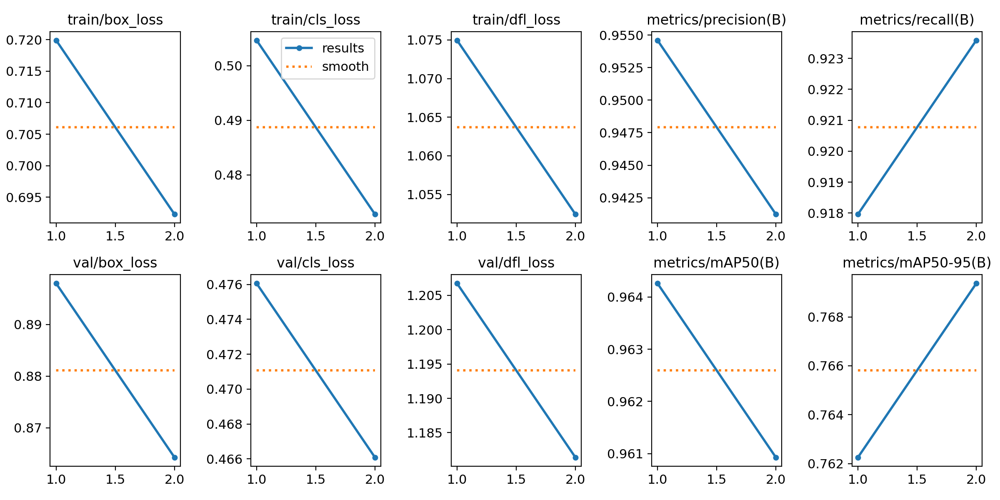

In [23]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason...
#from utils.general import plot_results  # plot results.txt as results.png
from IPython.display import Image, display
display(Image('/content/ScaledYOLOv4/runs/detect/train3/results.png'))  # view results.png

### Curious? Visualize Our Training Data with Labels

After training starts, view `train*.jpg` images to see training images, labels and augmentation effects.

Note a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in [YOLOv4](https://arxiv.org/abs/2004.10934).

GROUND TRUTH TRAINING DATA:


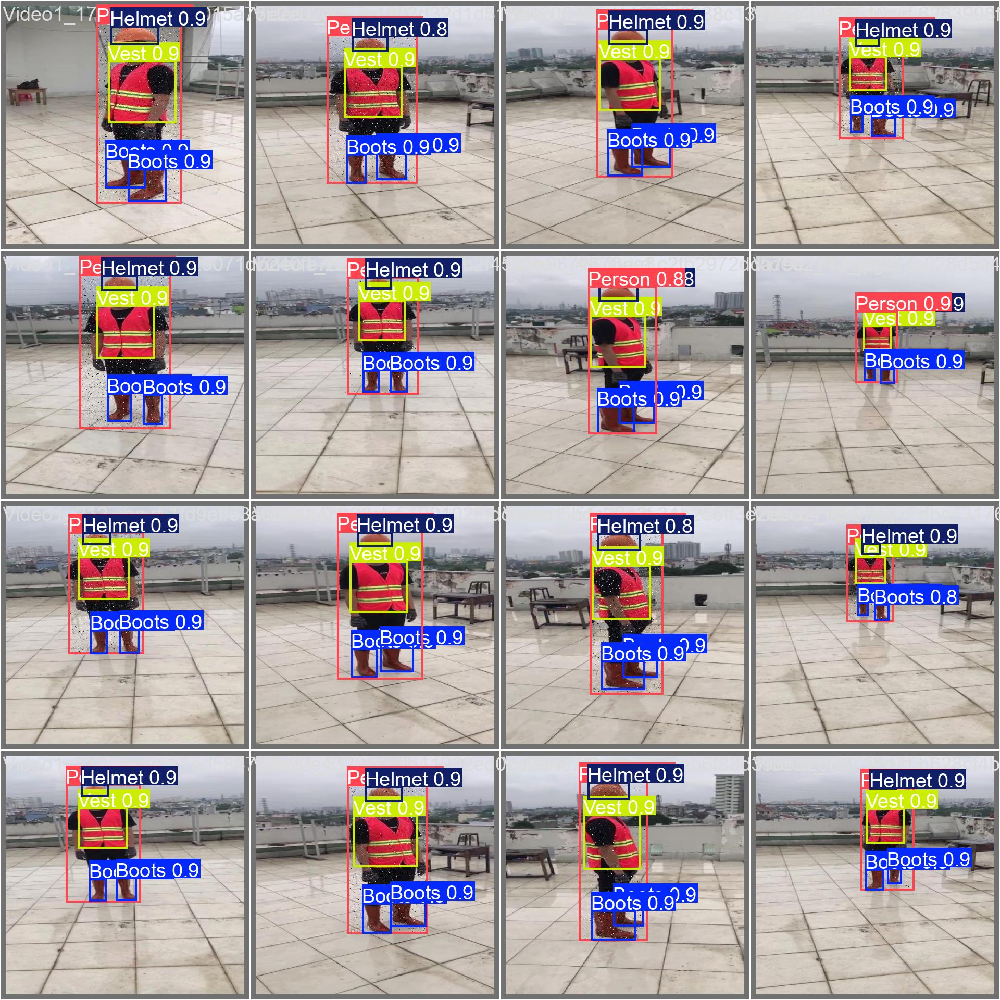

In [24]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/ScaledYOLOv4/runs/detect/train3/val_batch1_pred.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


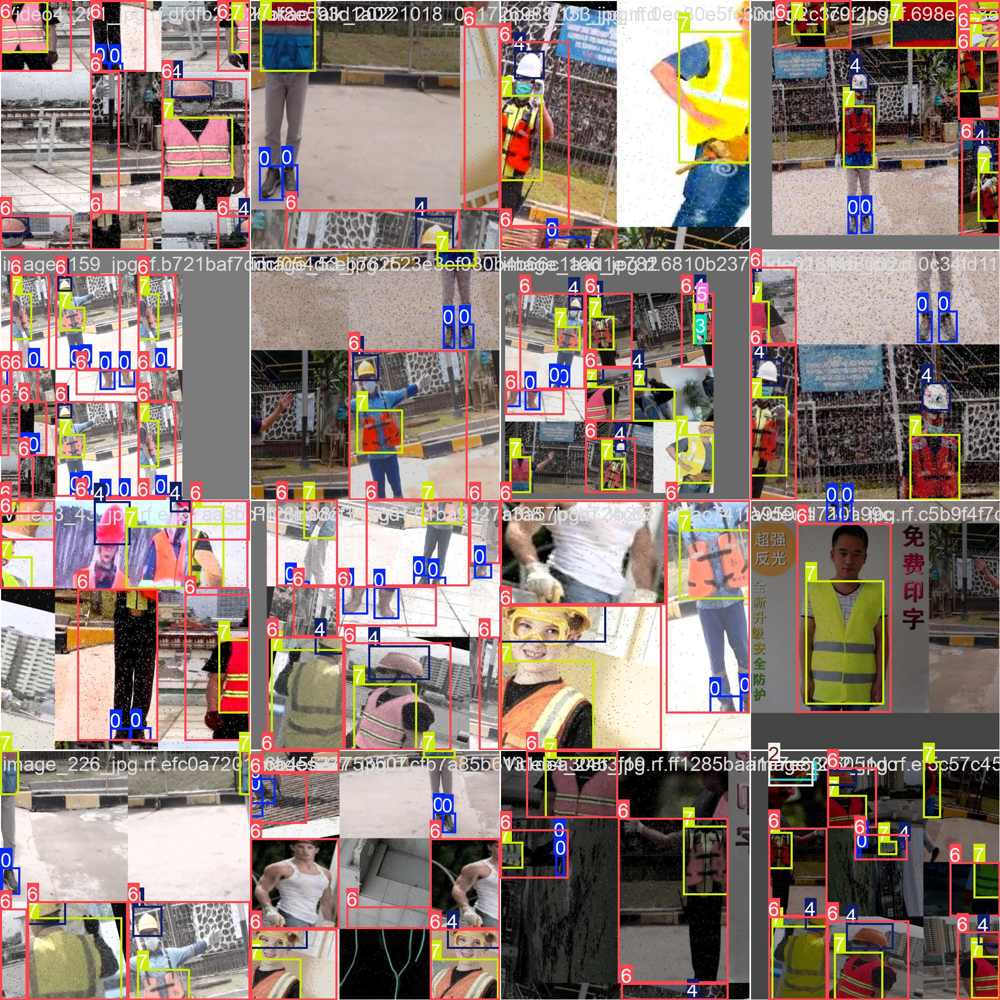

In [25]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/ScaledYOLOv4/runs/detect/train2/train_batch1.jpg', width=900)

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [32]:
%cd /content/ScaledYOLOv4

/content/ScaledYOLOv4


In [33]:
# trained weights are saved by default in our weights folder
%ls runs/

detect/  exp0_yolov4-csp-results/


In [34]:
%ls ./runs/exp0_yolov4-csp-results/weights

# Test code

In [35]:
from ultralytics import YOLO

# Load a pretrained YOLO11n model
model = YOLO("/content/ScaledYOLOv4/runs/detect/train/weights/best.pt")

# Run inference on 'bus.jpg' with arguments
model.predict("/content/ScaledYOLOv4/safety-1/test/images/00113_jpg.rf.70816ad5893dab7fc737b7957616ee28.jpg", save=True, imgsz=640, conf=0.5)


image 1/1 /content/ScaledYOLOv4/safety-1/test/images/00113_jpg.rf.70816ad5893dab7fc737b7957616ee28.jpg: 640x640 1 Helmet, 1 Vest, 37.1ms
Speed: 2.3ms preprocess, 37.1ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict


[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Boots', 1: 'Ear-protection', 2: 'Glass', 3: 'Glove', 4: 'Helmet', 5: 'Mask', 6: 'Person', 7: 'Vest'}
 obb: None
 orig_img: array([[[194, 190, 189],
         [193, 189, 188],
         [192, 188, 187],
         ...,
         [125, 125, 125],
         [144, 144, 144],
         [152, 152, 152]],
 
        [[194, 190, 189],
         [193, 189, 188],
         [192, 188, 187],
         ...,
         [137, 137, 137],
         [133, 133, 133],
         [126, 126, 126]],
 
        [[193, 189, 188],
         [193, 189, 188],
         [191, 187, 186],
         ...,
         [160, 160, 160],
         [126, 126, 126],
         [ 98,  98,  98]],
 
        ...,
 
        [[ 66,  66,  66],
         [ 67,  67,  67],
         [ 69,  69,  69],
         ...,
         [175, 170, 169],
         [176, 171, 170],
         [176, 171, 170]],
 
        [[ 58,  58

Running Inference:

In [ ]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/ScaledYOLOv4/
TEST_DIR = f'{dataset.location}/test/images'
!python detect.py --weights ./runs/exp0_yolov4-csp-results/weights/best_yolov4-csp-results.pt --img 416 --conf 0.4 --source {TEST_DIR}

/content/ScaledYOLOv4
Namespace(weights=['./runs/exp2_yolov4-csp-results/weights/best_yolov4-csp-results.pt'], source='/content/Construction-Site-Safety-30/test/images', output='inference/output', img_size=416, conf_thres=0.4, iou_thres=0.5, device='', view_img=False, save_txt=False, classes=None, agnostic_nms=False, augment=False, update=False)
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15101MB)

Fusing layers... Model Summary: 235 layers, 5.25998e+07 parameters, 5.04494e+07 gradients
/usr/local/lib/python3.9/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
image 1/82 /content/Construction-Site-Safety-30/test/images/-4405-_png_jpg.rf.937688313347dbcd3b24201dd7882906.jpg: 416x416 Done. (0.129s)
image 2/82 /content/Constructio

In [ ]:
#display inference on ALL test images
#this looks much better with longer training above
import glob
from IPython.display import Image, display

%cd /content/ScaledYOLOv4/
for imageName in glob.glob('./inference/output/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Export Trained Weights for Future Inference

Now that you have trained your custom detector, you can export the trained weights you have made here for inference on your device elsewhere

In [ ]:
from google.colab import files
files.download('./runs/exp0_yolov4-csp-results/weights/best_yolov4-csp-results.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Congrats!

Hope you enjoyed this!

--Team [Roboflow](https://roboflow.ai)